# __[데이터 & 라이브러리 호출]__

# __Chapter 01. 라이브러리 호출__

In [3]:
# 라이브러리 호출
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

In [4]:
# 한글 깨짐 방
plt.rcParams['font.family'] = 'Malgun Gothic'

----------

# __Chapter 02. 데이터 불러오기__

In [25]:
# 차종별 교통사고 유형 건수 데이터 호출
accident = pd.read_csv('data/preprocessed data/차종별 교통사고 유형 건수.csv', index_col=0)
accident.head()

,가해자차종,발생월,사고건수,사망자수,중상자수,경상자수,부상신고자수,연도,연월,계절
0,건설기계,1,97,8,59,113,1,2012,2012-01-01,겨울
1,건설기계,2,103,8,65,84,2,2012,2012-02-01,겨울
2,건설기계,3,125,5,76,129,4,2012,2012-03-01,봄
3,건설기계,4,125,5,74,165,6,2012,2012-04-01,봄
4,건설기계,5,143,11,97,174,7,2012,2012-05-01,봄


----------

# __[ 전동 킥보드 데이터 EDA 분석 ]__

# __Chapter 1. 차종별 사고 유형별 건수 분석__

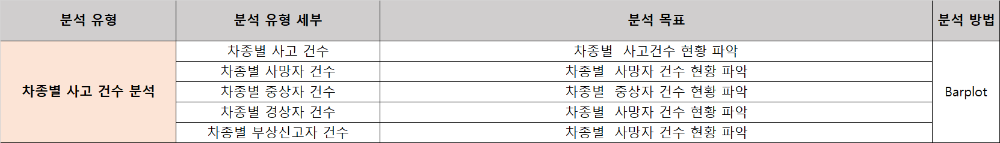악	



## __1-1. 차종별 사고 유형별 건수 분석 시각화(승용차 포함)__

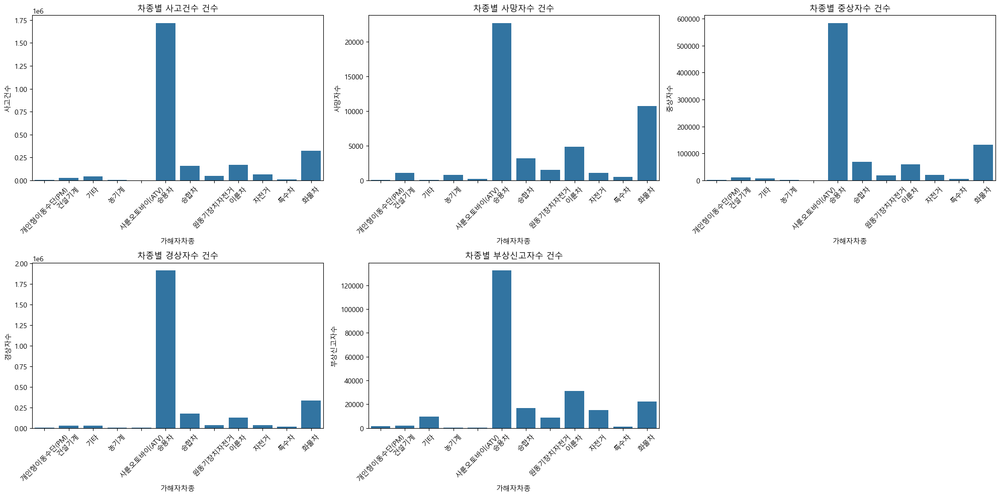

In [33]:
# subplots 설정
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
axes = axes.flatten()

# 차종별 사고건수 총합 집계
accident_count = accident.groupby('가해자차종')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()


for i, accident_type in enumerate(accident_count.columns.drop('가해자차종')):
    sns.barplot(data = accident_count, x='가해자차종', y=accident_type, ax=axes[i])
    axes[i].set_title(f'차종별 {accident_type} 건수')
    axes[i].tick_params(axis='x', rotation=45)


fig.delaxes(axes[5])
plt.tight_layout()

## __1-2. 차종별 사고 유형별 건수 분석 시각화(승용차 제외)__

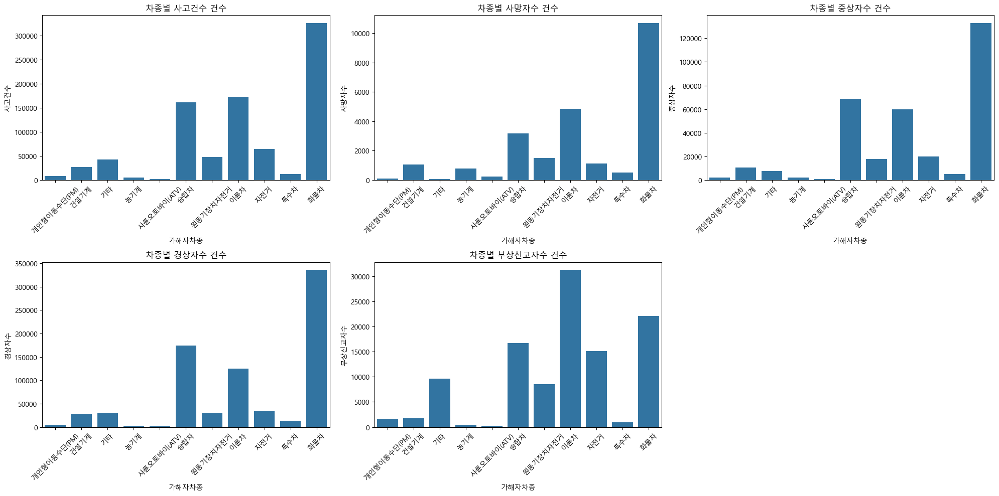

In [35]:
# subplots 설정
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
axes = axes.flatten()

# 차종별 사고건수 총합 집계
accident_count = accident.groupby('가해자차종')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()
accident_count = accident_count[accident_count['가해자차종'] != '승용차']


for i, accident_type in enumerate(accident_count.columns.drop('가해자차종')):
    sns.barplot(data = accident_count, x='가해자차종', y=accident_type, ax=axes[i])
    axes[i].set_title(f'차종별 {accident_type} 건수')
    axes[i].tick_params(axis='x', rotation=45)


fig.delaxes(axes[5])
plt.tight_layout()

## __1-3. 차종별 사고유형별 비율__

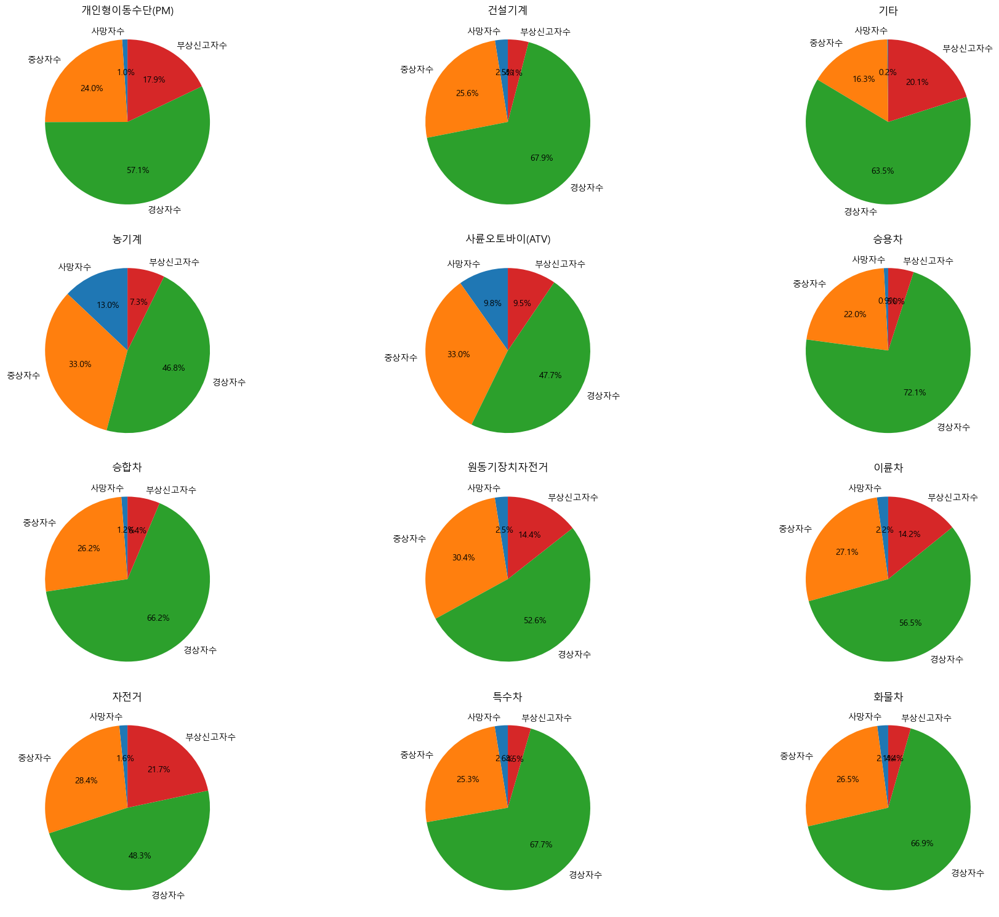

In [37]:
# 가해자차종별로 사고 유형(사망자수, 중상자수, 경상자수, 부상신고자수) 집계
accident_by_vehicle_type = accident.groupby('가해자차종')[['사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()

# 가해자차종 목록 가져오기
vehicle_types = accident_by_vehicle_type['가해자차종'].unique()

# 서브플롯 설정 (차종별로 각각의 파이 차트를 그릴 공간을 마련)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))  # 4x3 서브플롯
axes = axes.flatten()

# 차종별 파이 차트 그리기
for i, vehicle in enumerate(vehicle_types):
    
    # 특정 차종의 데이터만 선택
    vehicle_data = accident_by_vehicle_type[accident_by_vehicle_type['가해자차종'] == vehicle].iloc[0, 1:]
    
    # 파이 차트 그리기
    axes[i].pie(vehicle_data, labels=vehicle_data.index, autopct='%1.1f%%', startangle=90)
    axes[i].set_title(vehicle)

# 레이아웃 조정 및 차트 표시
plt.tight_layout()
plt.show()

----------

# __Chapter 2. 연도별 사고량 분석__

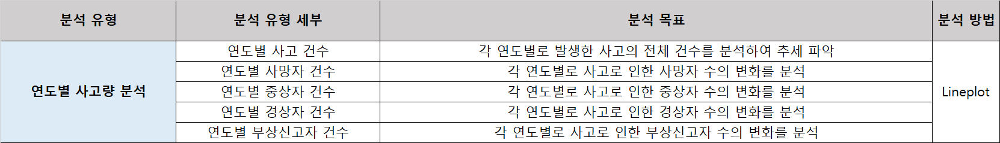

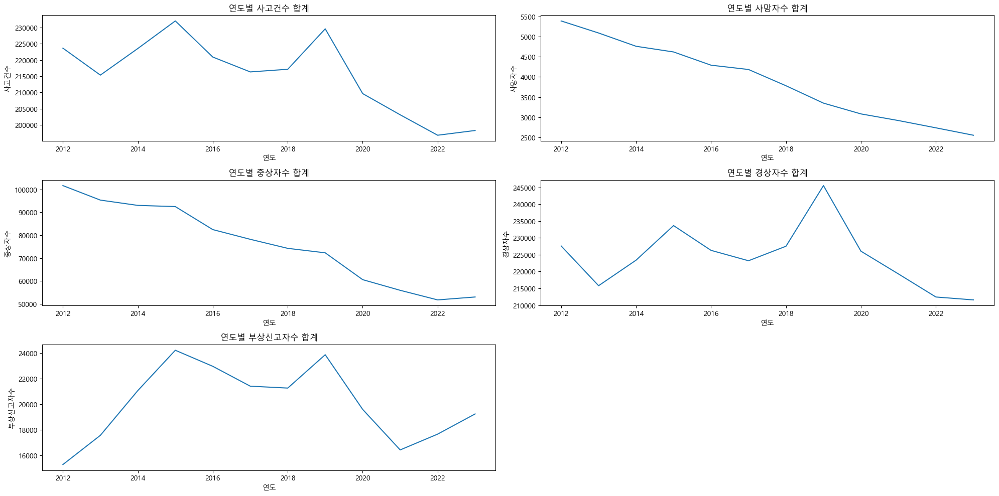

In [41]:
accident_count = accident.groupby('연도')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()
accident_count

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20,10))
axes = axes.flatten()

for i, accident_type in enumerate(accident_count.columns[1:6]):
    sns.lineplot(data=accident_count, x='연도', y=accident_type, ax=axes[i])
    axes[i].set_title(f'연도별 {accident_type} 합계')


fig.delaxes(axes[5])
plt.tight_layout()

-------------

# __Chapter 3. 월별 사고량 분석__

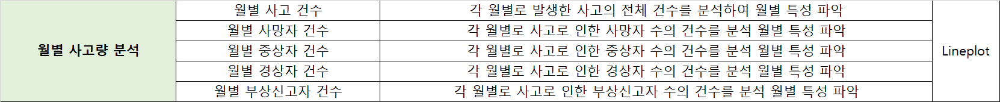

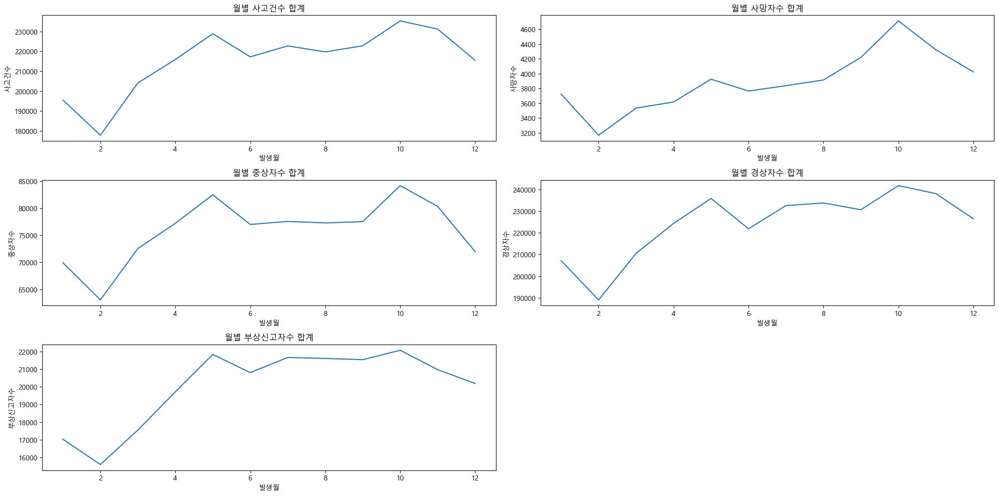

In [45]:
accident_count = accident.groupby('발생월')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()
accident_count

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20,10))
axes = axes.flatten()

for i, accident_type in enumerate(accident_count.columns[1:6]):
    sns.lineplot(data=accident_count, x='발생월', y=accident_type, ax=axes[i])
    axes[i].set_title(f'월별 {accident_type} 합계')


fig.delaxes(axes[5])
plt.tight_layout()

----

# __Chapter 4. 연월별 사고량 분석__

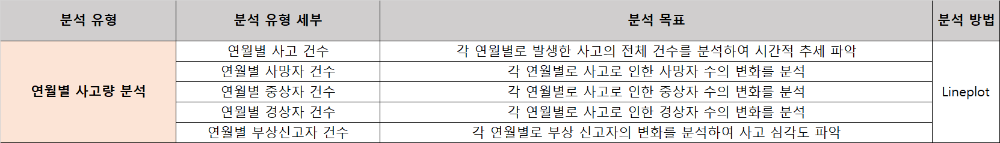

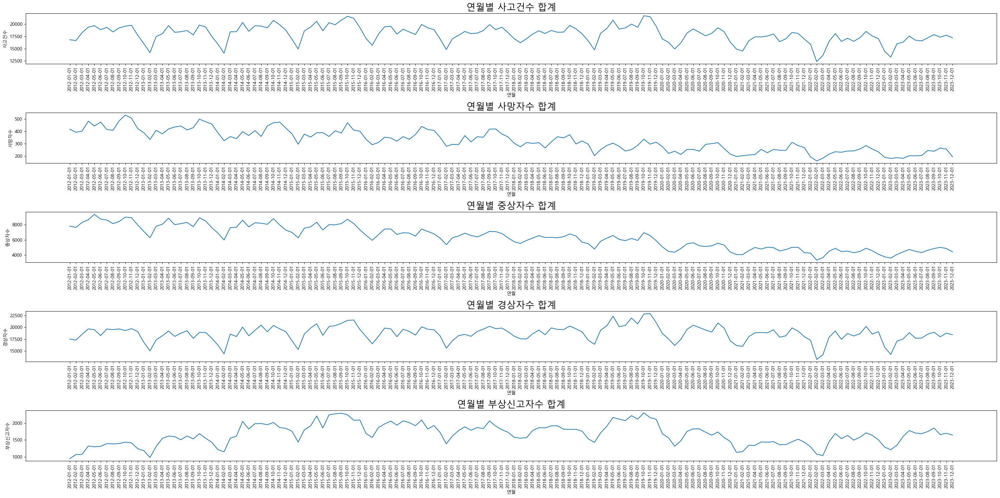

In [49]:
accident_count = accident.groupby('연월')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()
accident_count

fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(30,15))
axes = axes.flatten()

for i, accident_type in enumerate(accident_count.columns[1:6]):
    sns.lineplot(data=accident_count, x='연월', y=accident_type, ax=axes[i])
    axes[i].set_title(f'연월별 {accident_type} 합계', fontsize=20)
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()

--------

# __Chapter 5. 계절별 사고량 분석__

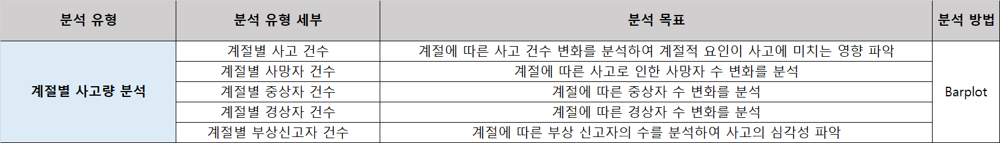

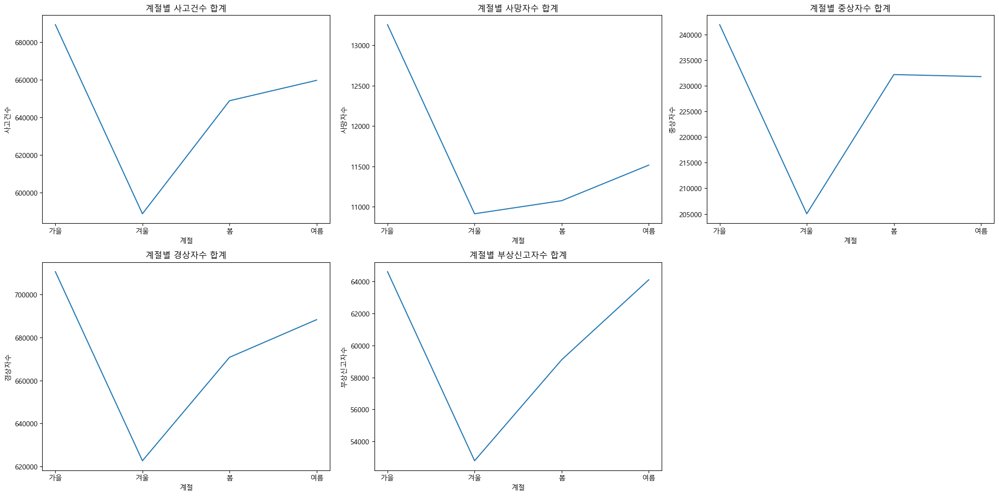

In [53]:
accident_count = accident.groupby('계절')[['사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수']].sum().reset_index()
accident_count

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, accident_type in enumerate(accident_count.columns[1:6]):
    sns.lineplot(data=accident_count, x='계절', y=accident_type, ax=axes[i])
    axes[i].set_title(f'계절별 {accident_type} 합계')

fig.delaxes(axes[5])
plt.tight_layout()

# __Chapter 6. 연도별 차종별 사고량 분석__

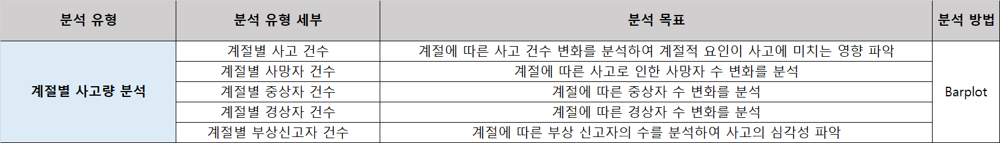

## __6-1. 연도별 차종별 사고 건수__

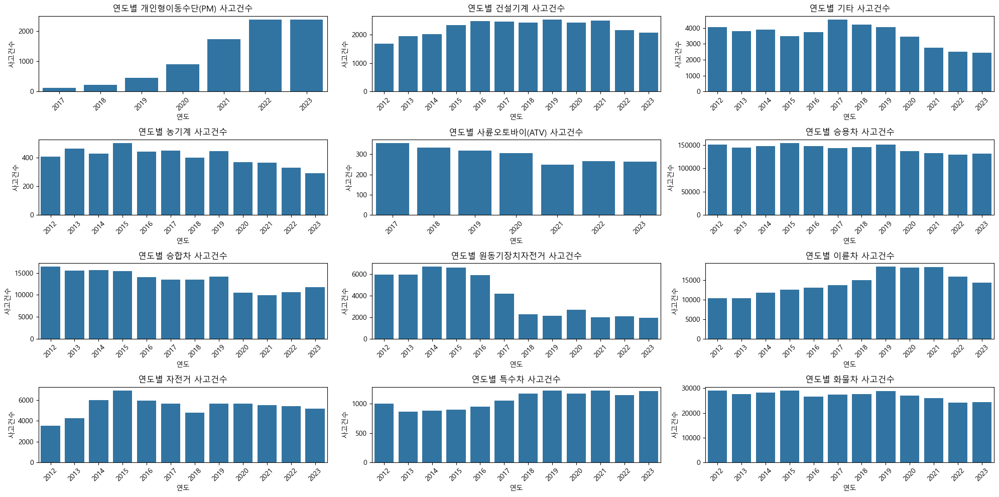

In [58]:
accident_year_mean = accident.groupby(['가해자차종','연도'])['사고건수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='연도', y='사고건수', ax=axes[i])
    axes[i].set_title(f'연도별 {vehicle} 사고건수')
    axes[i].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

## __6-2. 연도별 차종별 사망자 건수__

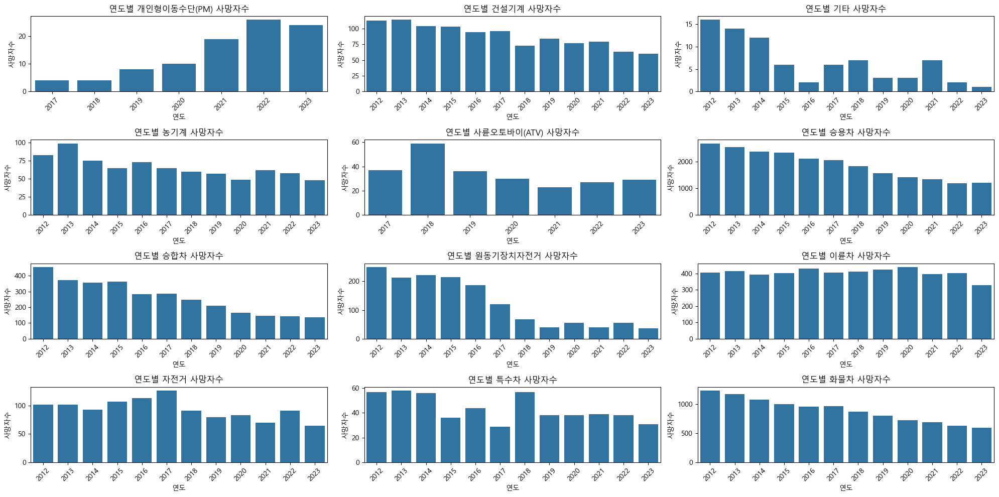

In [60]:
accident_year_mean = accident.groupby(['가해자차종','연도'])['사망자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='연도', y='사망자수', ax=axes[i])
    axes[i].set_title(f'연도별 {vehicle} 사망자수')
    axes[i].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

## __6-3. 연도별 차종별 중상자 건수__

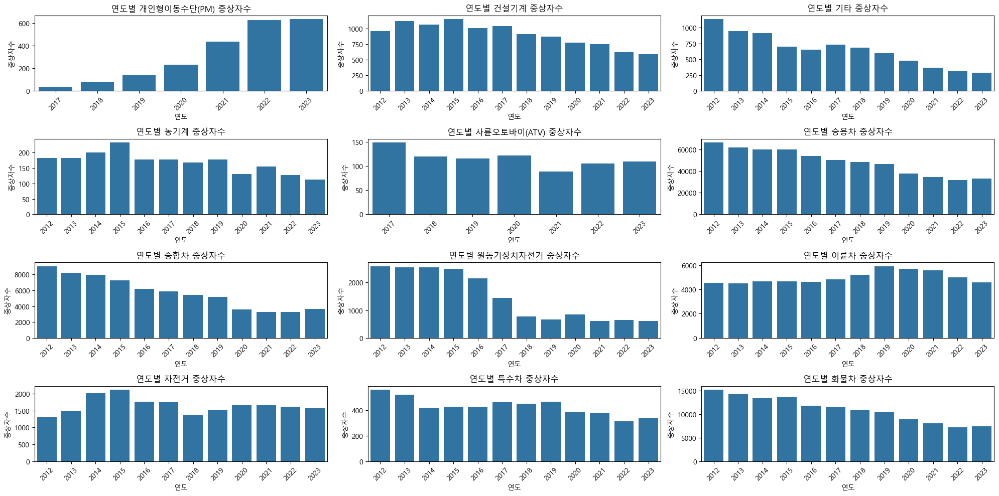

In [62]:
accident_year_mean = accident.groupby(['가해자차종','연도'])['중상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='연도', y='중상자수', ax=axes[i])
    axes[i].set_title(f'연도별 {vehicle} 중상자수')
    axes[i].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

## __6-4. 연도별 차종별 경상자 건수__

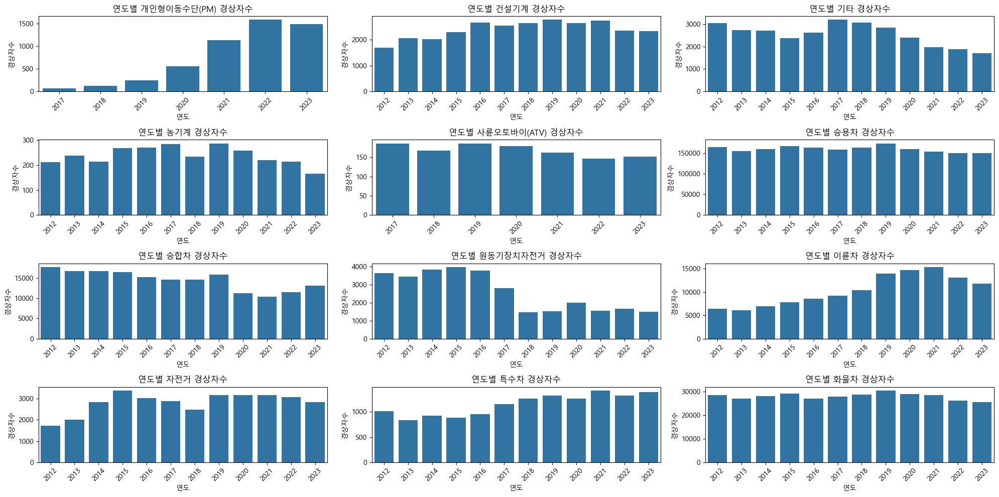

In [64]:
accident_year_mean = accident.groupby(['가해자차종','연도'])['경상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='연도', y='경상자수', ax=axes[i])
    axes[i].set_title(f'연도별 {vehicle} 경상자수')
    axes[i].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

## __6-5. 연도별 차종별 부상신고자 건수__

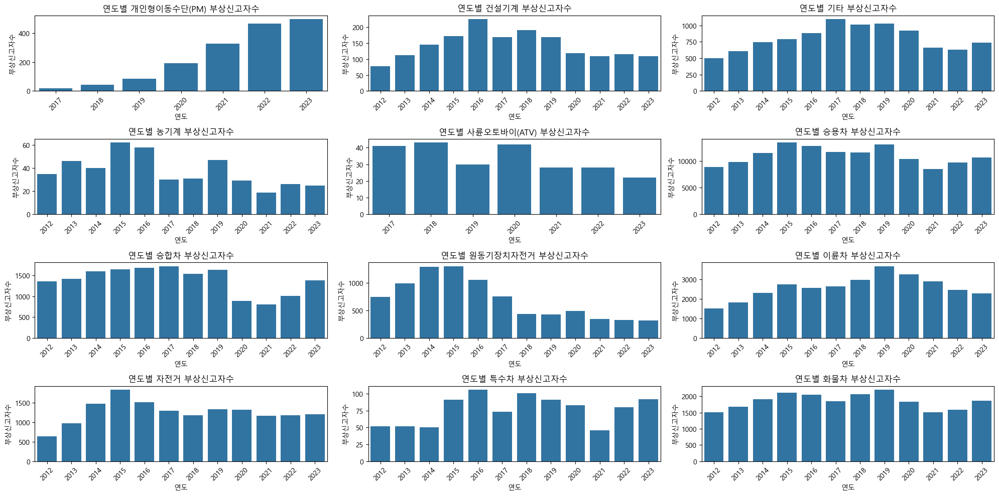

In [66]:
accident_year_mean = accident.groupby(['가해자차종','연도'])['부상신고자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='연도', y='부상신고자수', ax=axes[i])
    axes[i].set_title(f'연도별 {vehicle} 부상신고자수')
    axes[i].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

-------

# __Chapter 7. 월별 차종별 사고량 분석__

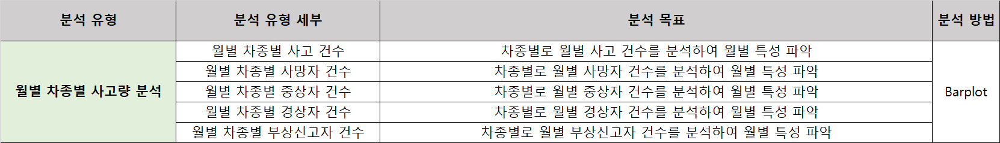

## __7-1. 월별 사고 건수__

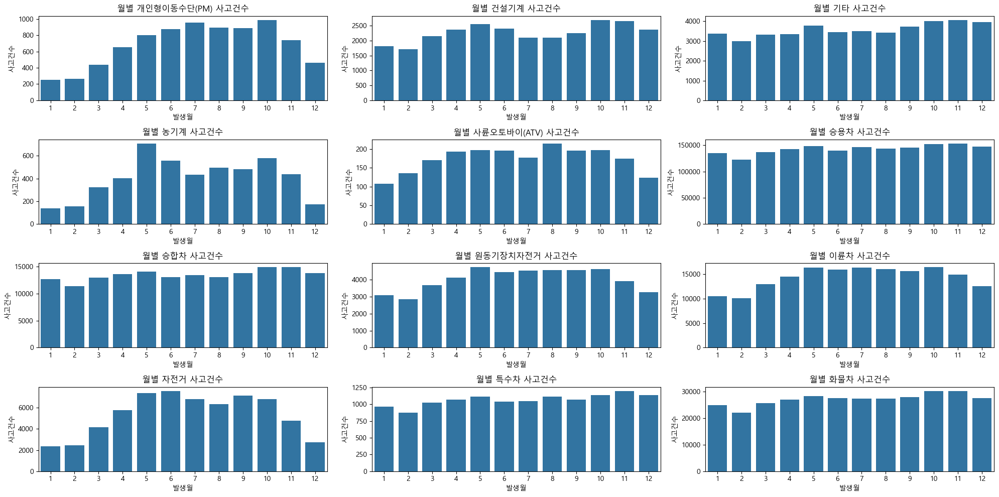

In [71]:
accident_year_mean = accident.groupby(['가해자차종','발생월'])['사고건수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='발생월', y='사고건수', ax=axes[i])
    axes[i].set_title(f'월별 {vehicle} 사고건수')


plt.tight_layout()
plt.show()

## __7-2. 월별 사망자 건수__

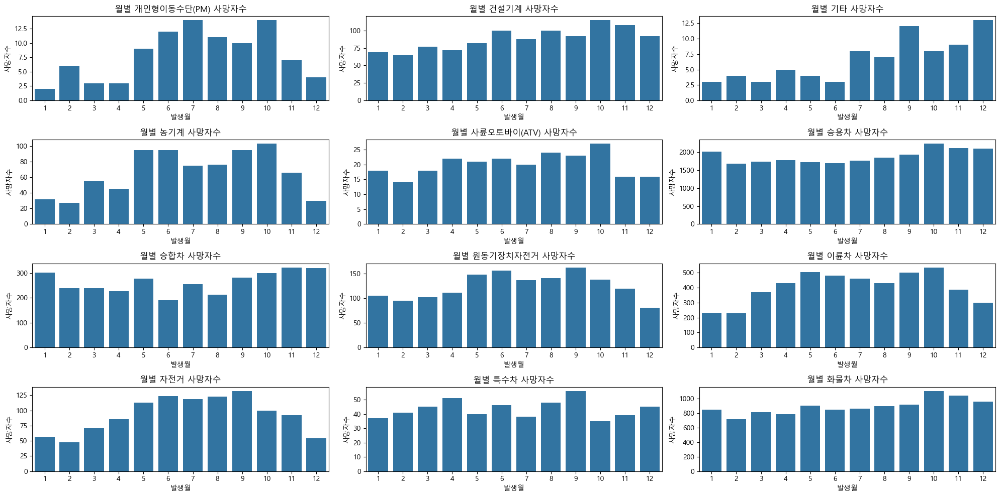

In [73]:
accident_year_mean = accident.groupby(['가해자차종','발생월'])['사망자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='발생월', y='사망자수', ax=axes[i])
    axes[i].set_title(f'월별 {vehicle} 사망자수')


plt.tight_layout()
plt.show()

## __7-3. 월별 중상자 건수__

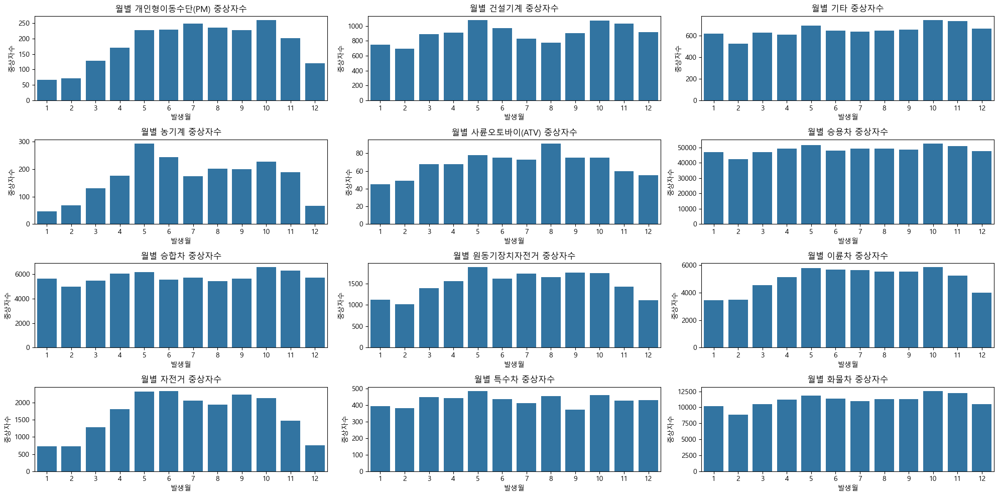

In [75]:
accident_year_mean = accident.groupby(['가해자차종','발생월'])['중상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='발생월', y='중상자수', ax=axes[i])
    axes[i].set_title(f'월별 {vehicle} 중상자수')


plt.tight_layout()
plt.show()

## __7-4. 월별 경상자 건수__

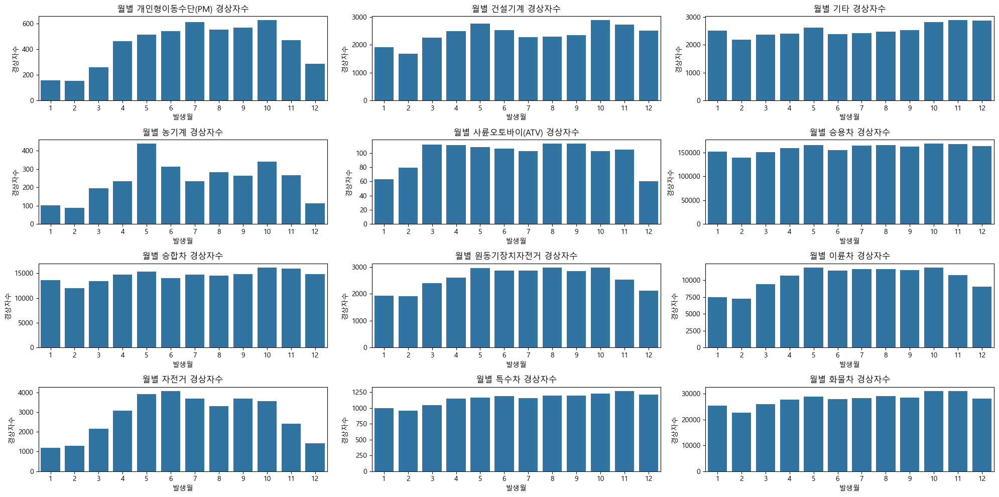

In [78]:
accident_year_mean = accident.groupby(['가해자차종','발생월'])['경상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='발생월', y='경상자수', ax=axes[i])
    axes[i].set_title(f'월별 {vehicle} 경상자수')


plt.tight_layout()
plt.show()

## __7-5. 월별 부상신고자 건수__

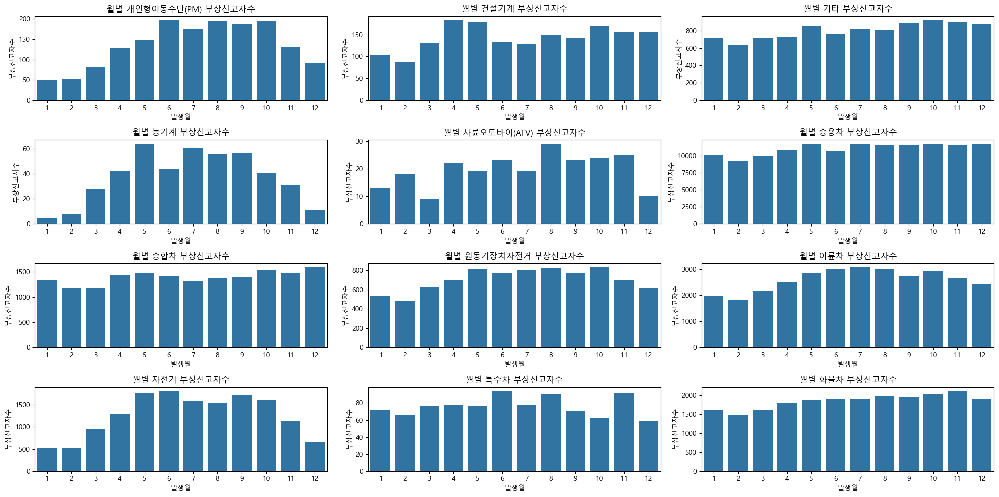

In [80]:
accident_year_mean = accident.groupby(['가해자차종','발생월'])['부상신고자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,10))
axes = axes.flatten()

for i, vehicle in enumerate(accident_year_mean['가해자차종'].unique()):
    sns.barplot(data=accident_year_mean[accident_year_mean['가해자차종']==vehicle], x='발생월', y='부상신고자수', ax=axes[i])
    axes[i].set_title(f'월별 {vehicle} 부상신고자수')


plt.tight_layout()
plt.show()

-----------

# __Chapter 8. 연월별 차종별 사고량 분석__

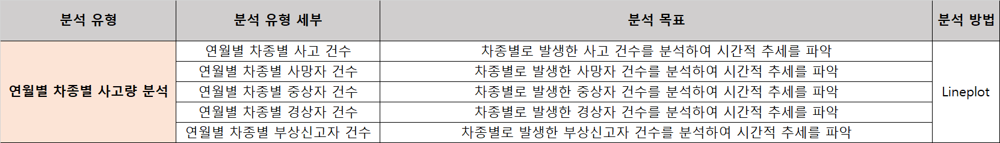

## __8-1. 연월별 차종별 사고 건수__

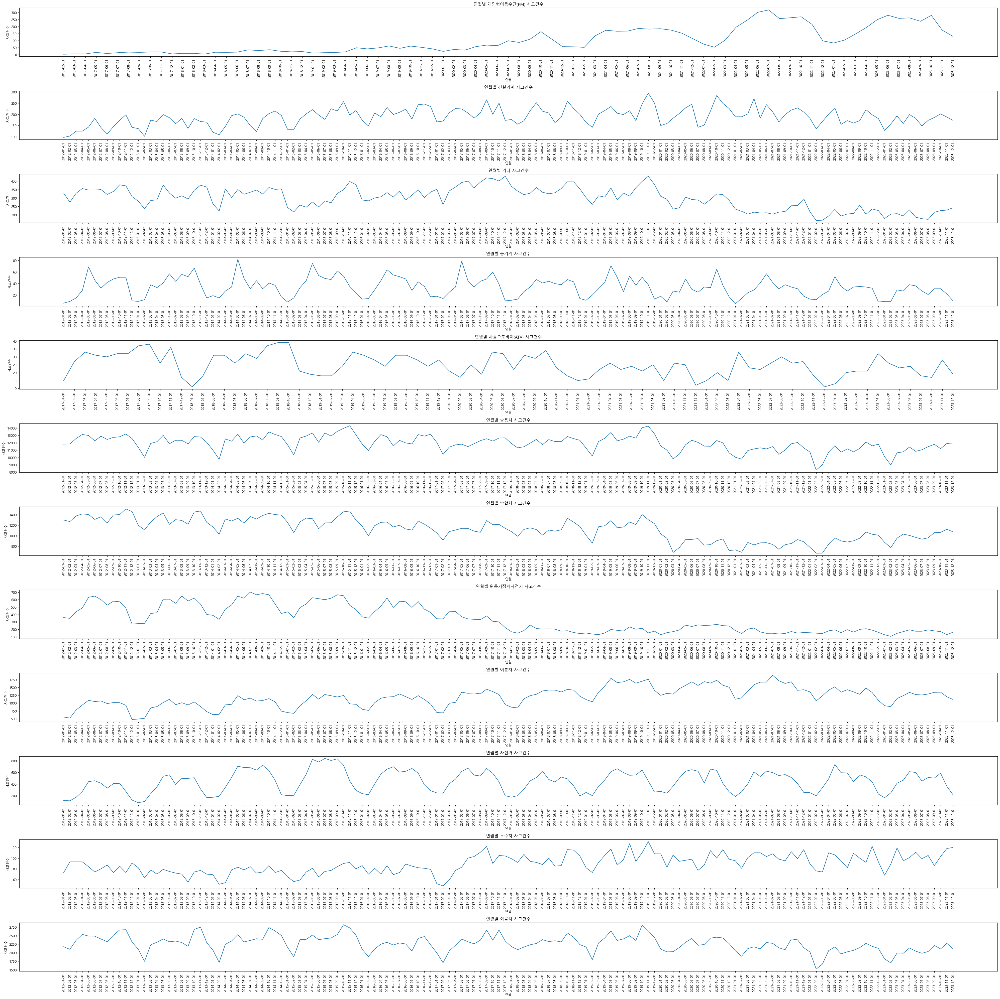

In [85]:
accident_ym = accident.groupby(['가해자차종', '연월'])['사고건수'].sum().reset_index()

fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(40,40))
axes = axes.flatten()

for i, vehicle in enumerate(accident_ym['가해자차종'].unique()):
    sns.lineplot(data=accident_ym[accident_ym['가해자차종']==vehicle], x='연월', y='사고건수', ax=axes[i])
    axes[i].set_title(f'연월별 {vehicle} 사고건수')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

## __8-2. 연월별 차종별 사망자 건수__

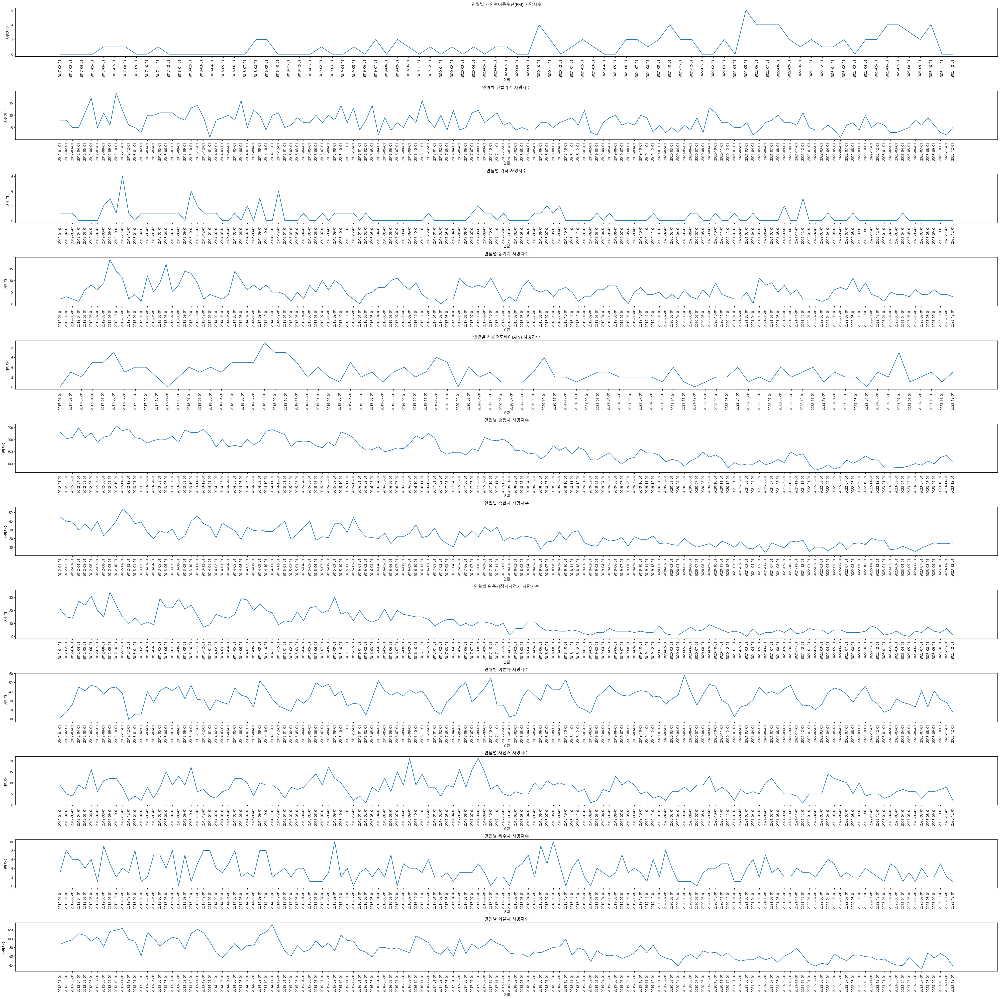

In [87]:
accident_ym = accident.groupby(['가해자차종', '연월'])['사망자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(40,40))
axes = axes.flatten()

for i, vehicle in enumerate(accident_ym['가해자차종'].unique()):
    sns.lineplot(data=accident_ym[accident_ym['가해자차종']==vehicle], x='연월', y='사망자수', ax=axes[i])
    axes[i].set_title(f'연월별 {vehicle} 사망자수')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

## __8-3. 연월별 차종별 중상자 건수__

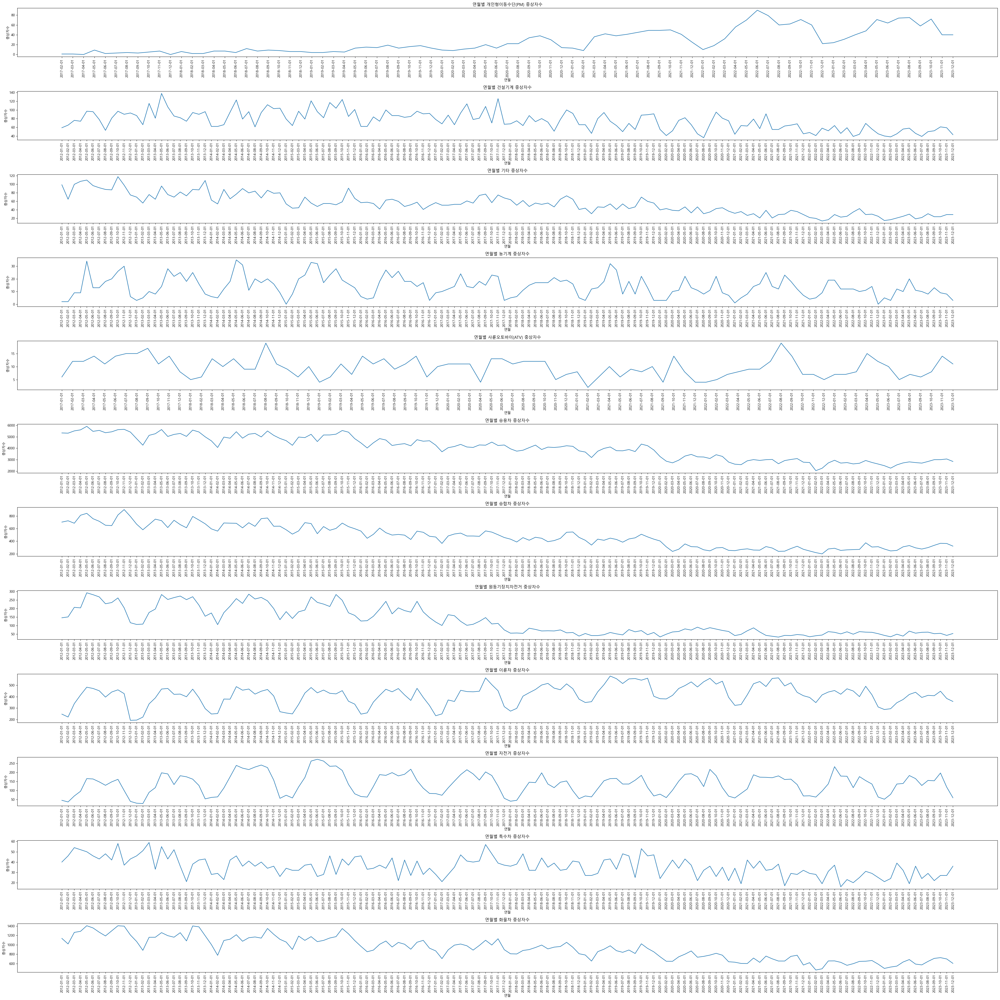

In [89]:
accident_ym = accident.groupby(['가해자차종', '연월'])['중상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(40,40))
axes = axes.flatten()

for i, vehicle in enumerate(accident_ym['가해자차종'].unique()):
    sns.lineplot(data=accident_ym[accident_ym['가해자차종']==vehicle], x='연월', y='중상자수', ax=axes[i])
    axes[i].set_title(f'연월별 {vehicle} 중상자수')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

## __8-4. 연월별 차종별 경상자 건수__

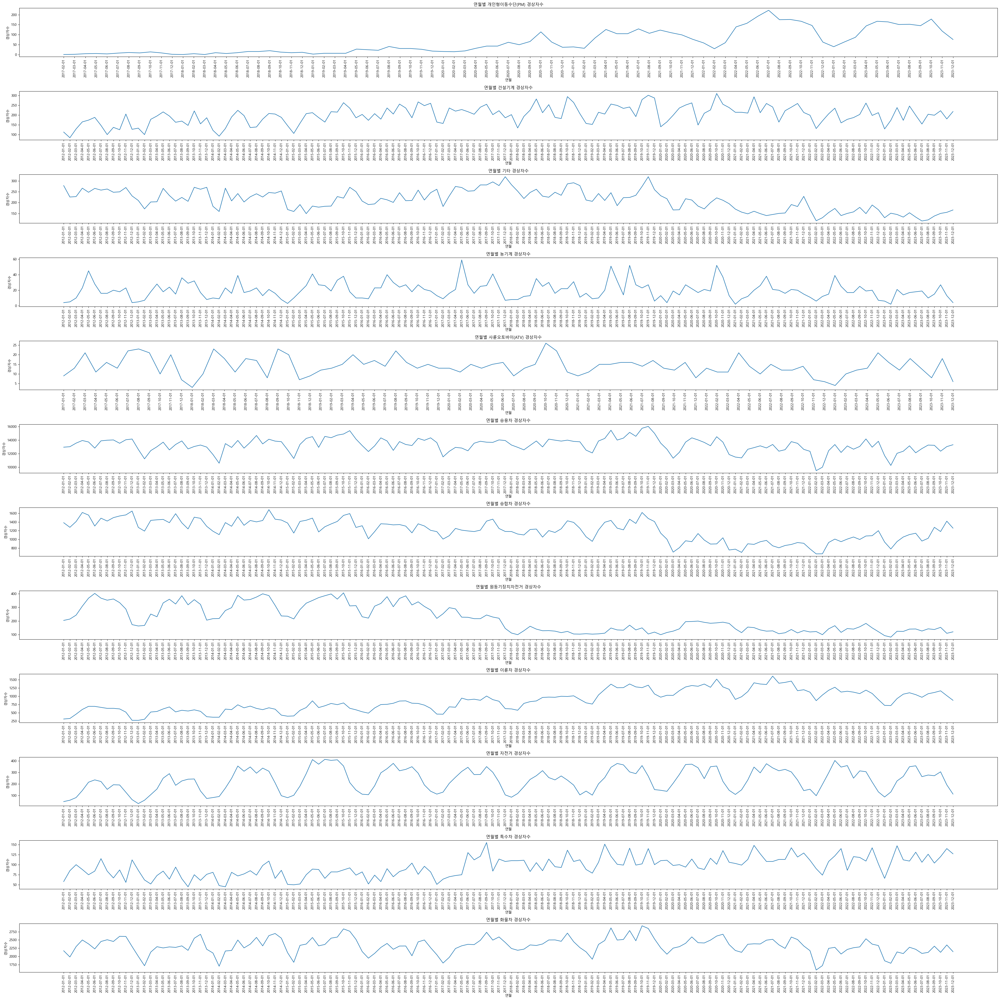

In [91]:
accident_ym = accident.groupby(['가해자차종', '연월'])['경상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(40,40))
axes = axes.flatten()

for i, vehicle in enumerate(accident_ym['가해자차종'].unique()):
    sns.lineplot(data=accident_ym[accident_ym['가해자차종']==vehicle], x='연월', y='경상자수', ax=axes[i])
    axes[i].set_title(f'연월별 {vehicle} 경상자수')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

## __8-5. 연월별 차종별 부상신고자 건수__

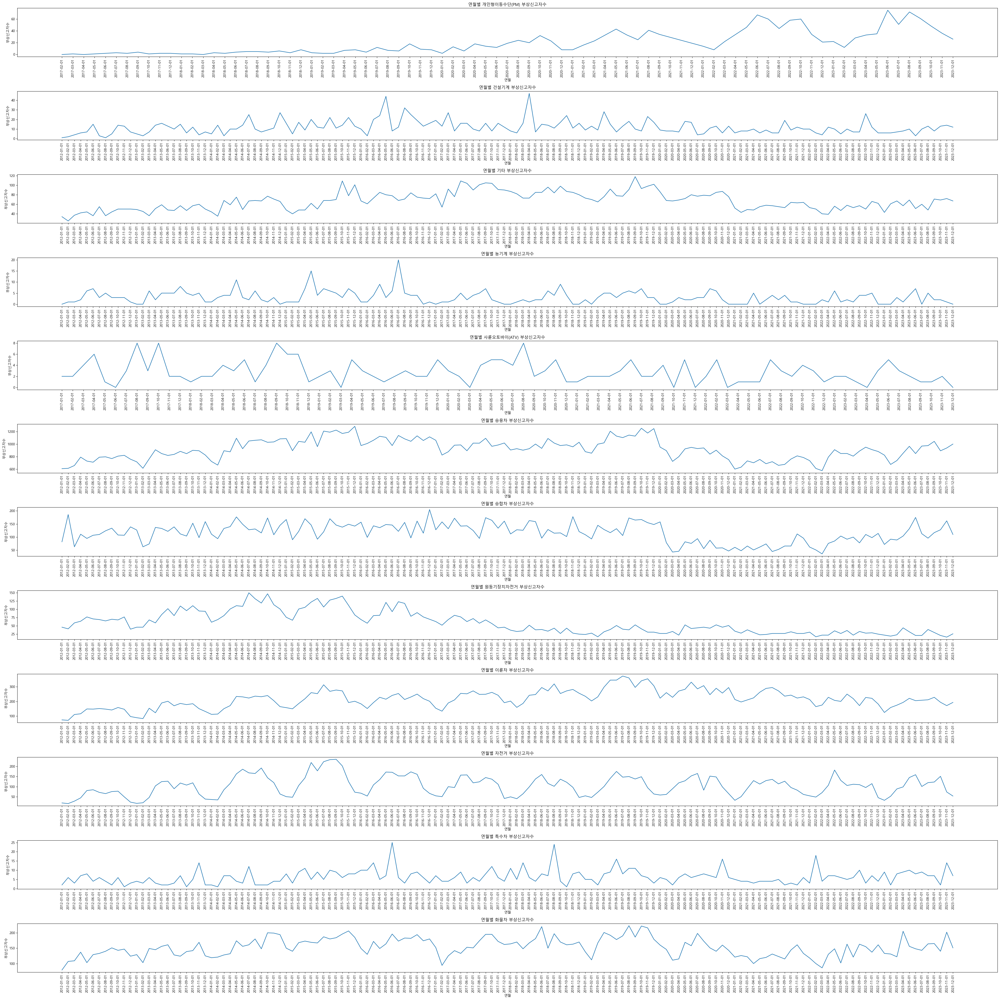

In [93]:
accident_ym = accident.groupby(['가해자차종', '연월'])['부상신고자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=12, ncols=1, figsize=(40,40))
axes = axes.flatten()

for i, vehicle in enumerate(accident_ym['가해자차종'].unique()):
    sns.lineplot(data=accident_ym[accident_ym['가해자차종']==vehicle], x='연월', y='부상신고자수', ax=axes[i])
    axes[i].set_title(f'연월별 {vehicle} 부상신고자수')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

---------------

# __Chapter 9. 계절별 차종별 사고량 분석__

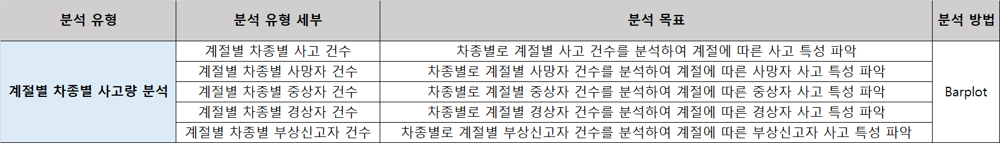

## __9-1. 계절별 차종별 사고 건수__

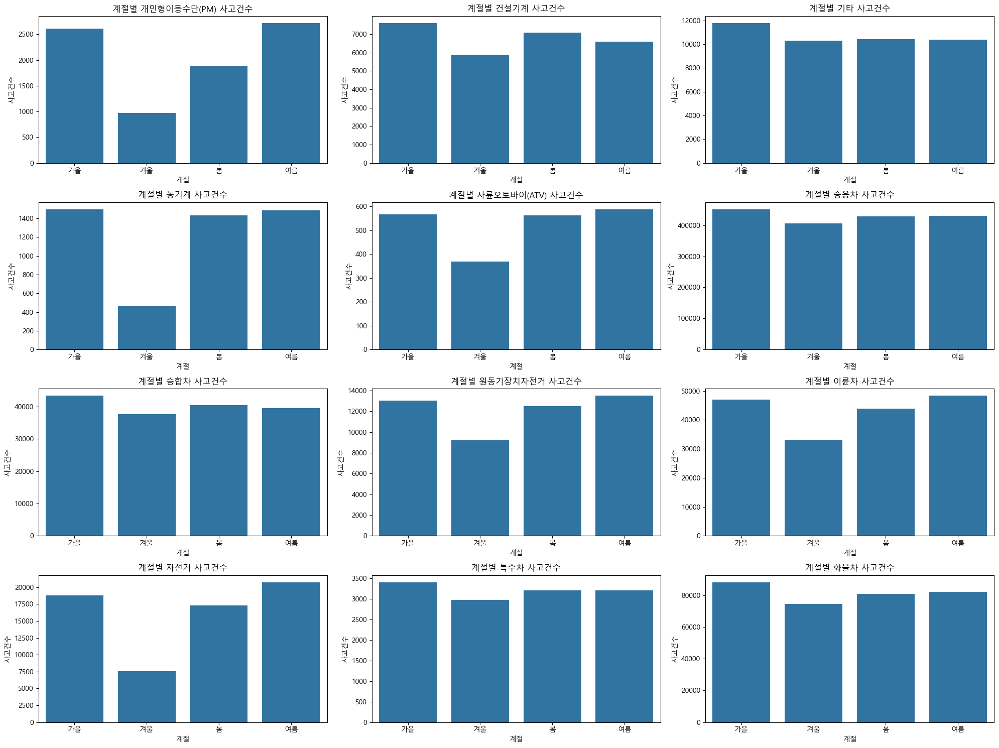

In [99]:
accident_season = accident.groupby(['계절', '가해자차종'])['사고건수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,15))
axes = axes.flatten()

for i, vehicle in enumerate(accident_season['가해자차종'].unique()):
    sns.barplot(data=accident_season[accident_season['가해자차종']==vehicle], x='계절', y='사고건수', ax=axes[i])
    axes[i].set_title(f'계절별 {vehicle} 사고건수')

plt.tight_layout()
plt.show()

## __9-2. 계절별 차종별 사망자 건수__

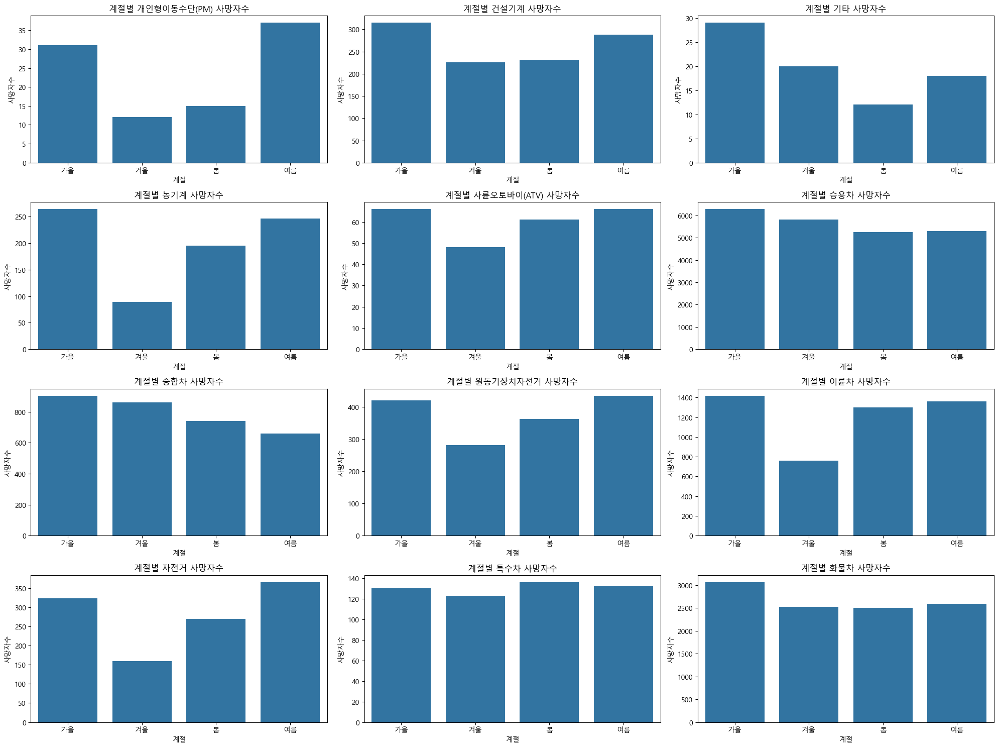

In [101]:
accident_season = accident.groupby(['계절', '가해자차종'])['사망자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,15))
axes = axes.flatten()

for i, vehicle in enumerate(accident_season['가해자차종'].unique()):
    sns.barplot(data=accident_season[accident_season['가해자차종']==vehicle], x='계절', y='사망자수', ax=axes[i])
    axes[i].set_title(f'계절별 {vehicle} 사망자수')

plt.tight_layout()
plt.show()

## __9-3. 계절별 차종별 중상자 건수__

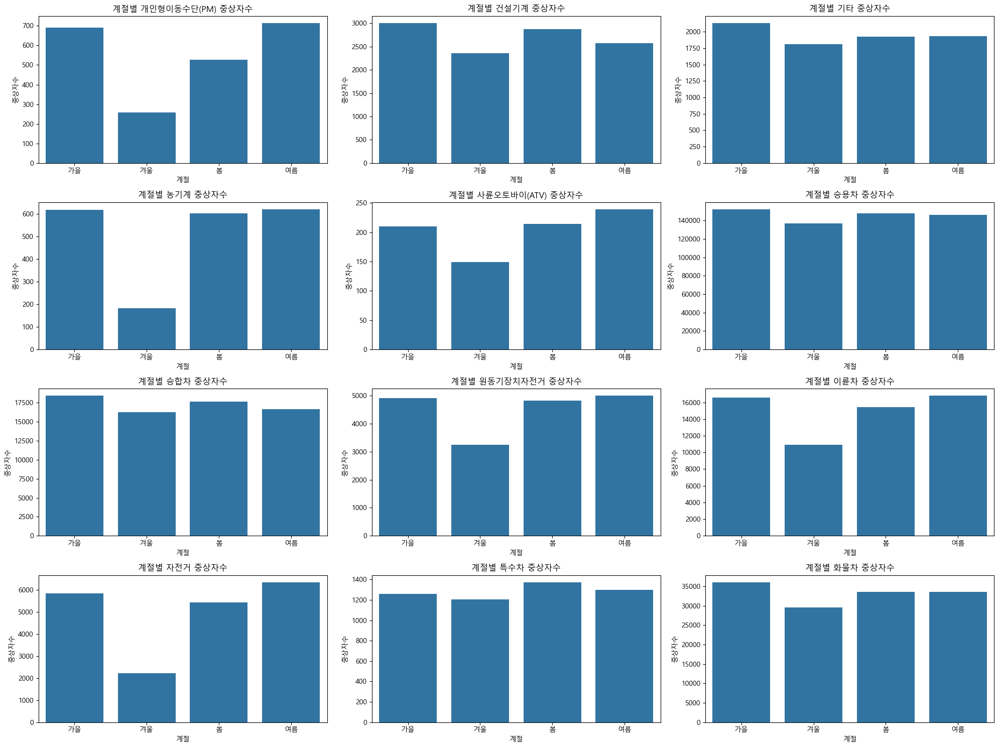

In [103]:
accident_season = accident.groupby(['계절', '가해자차종'])['중상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,15))
axes = axes.flatten()

for i, vehicle in enumerate(accident_season['가해자차종'].unique()):
    sns.barplot(data=accident_season[accident_season['가해자차종']==vehicle], x='계절', y='중상자수', ax=axes[i])
    axes[i].set_title(f'계절별 {vehicle} 중상자수')

plt.tight_layout()
plt.show()

## __9-4. 계절별 차종별 경상자 건수__

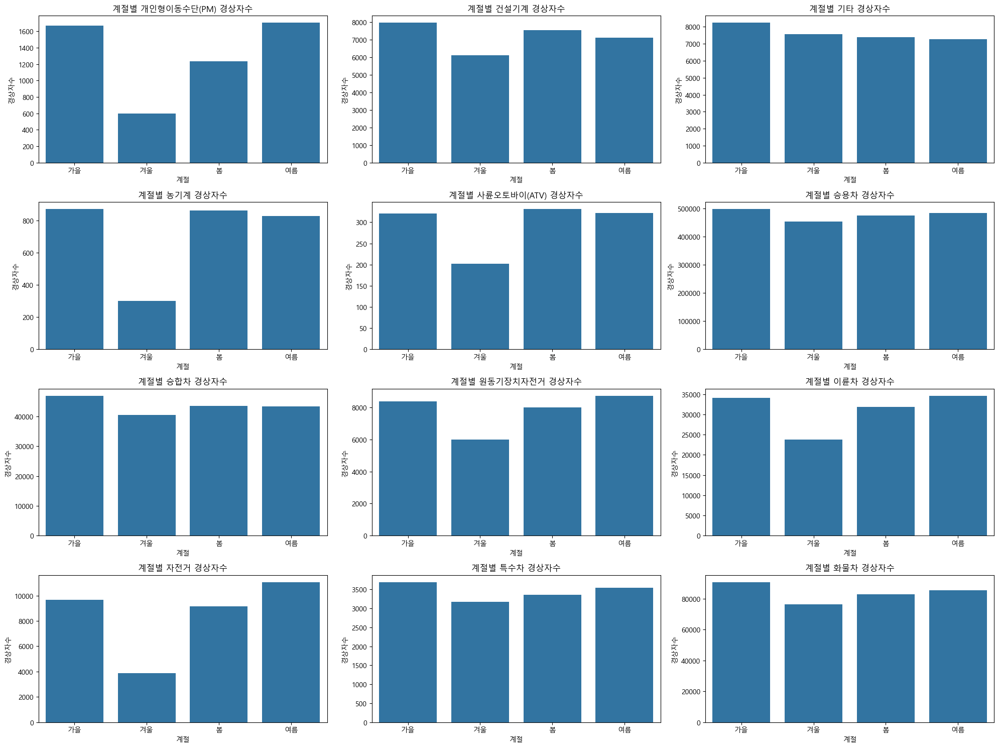

In [105]:
accident_season = accident.groupby(['계절', '가해자차종'])['경상자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,15))
axes = axes.flatten()

for i, vehicle in enumerate(accident_season['가해자차종'].unique()):
    sns.barplot(data=accident_season[accident_season['가해자차종']==vehicle], x='계절', y='경상자수', ax=axes[i])
    axes[i].set_title(f'계절별 {vehicle} 경상자수')

plt.tight_layout()
plt.show()

## __9-5. 계절별 차종별 부상신고자 건수__

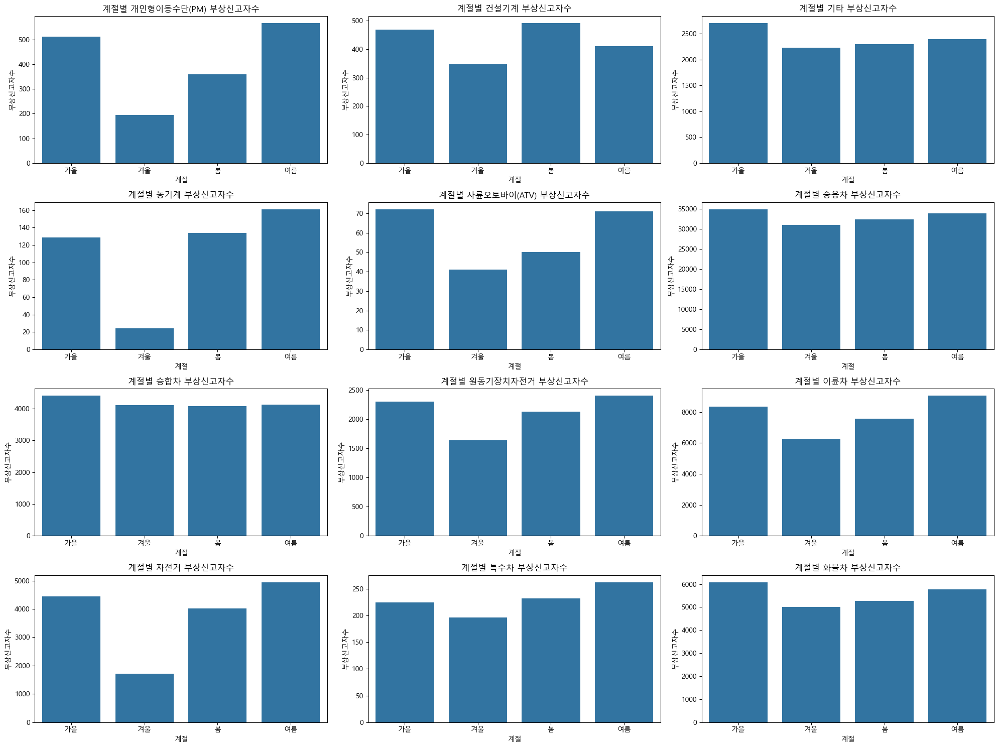

In [107]:
accident_season = accident.groupby(['계절', '가해자차종'])['부상신고자수'].sum().reset_index()

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,15))
axes = axes.flatten()

for i, vehicle in enumerate(accident_season['가해자차종'].unique()):
    sns.barplot(data=accident_season[accident_season['가해자차종']==vehicle], x='계절', y='부상신고자수', ax=axes[i])
    axes[i].set_title(f'계절별 {vehicle} 부상신고자수')

plt.tight_layout()
plt.show()

-------

# __Chapter 10. 차종별 2022, 2023년도 사고 발생 건수__

In [112]:
# 2022년 2023년 데이터만 추출
accident_recent = accident[accident['연도'].isin([2022, 2023])]

# 가해자차종과 연도별로 groupby
accident_count = accident_recent.groupby(['가해자차종', '연도'])[['사고건수', '사망자수', '중상자수', '부상신고자수']].sum().reset_index()

## __10-1. 2022년도 차종별 사고 건수 집계__

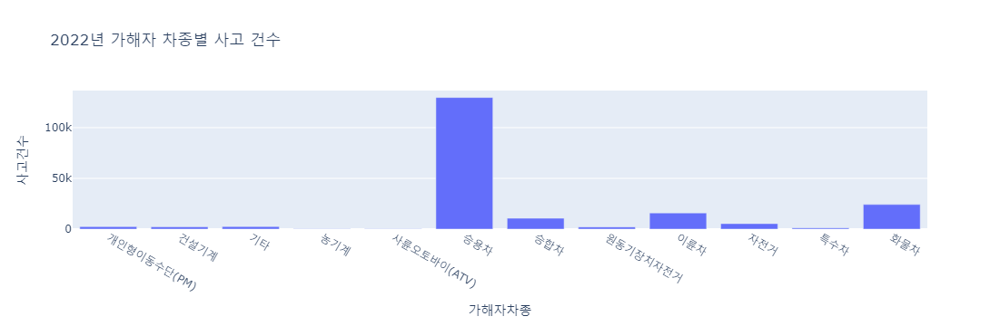

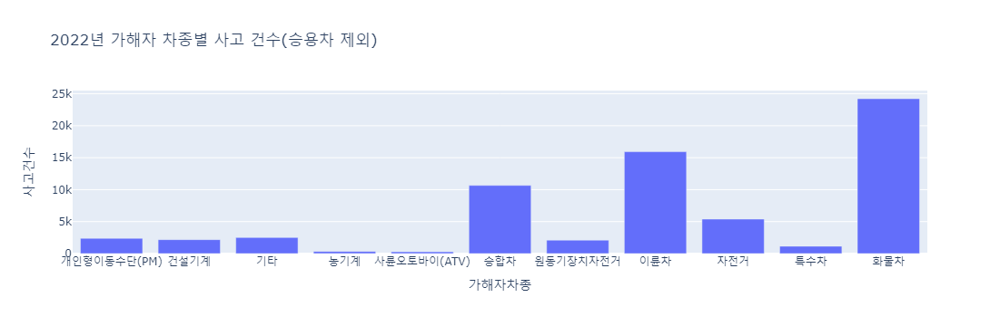

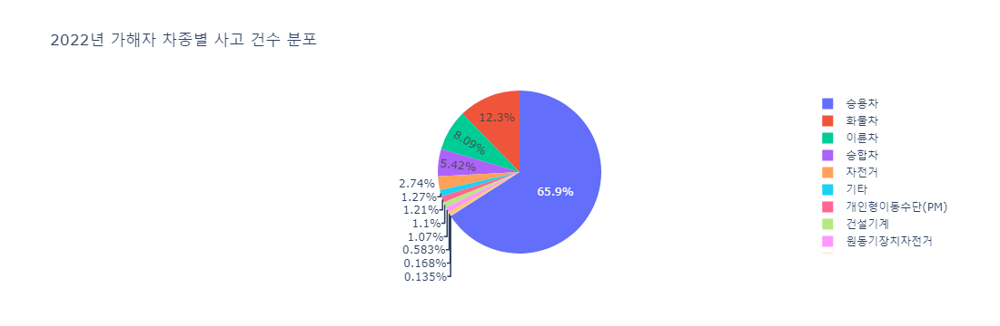

In [114]:
# 2022년 사고건수 전체 시각화
fig_all = px.bar(accident_count[accident_count['연도'] == 2022], x='가해자차종', y='사고건수', title="2022년 가해자 차종별 사고 건수")
fig_all.show()

# 2022년 사고 건수 승용차 제외하고 시각화
fig_exclude = px.bar(accident_count[(accident_count['연도'] == 2022) & (accident_count['가해자차종'] != '승용차')], 
                     x='가해자차종', y='사고건수', title="2022년 가해자 차종별 사고 건수(승용차 제외)")
fig_exclude.show()

# 2022년 사고건수 파이차트로 시각화
fig_pie = px.pie(accident_count[accident_count['연도'] == 2022], names='가해자차종', values='사고건수', title="2022년 가해자 차종별 사고 건수 분포")
fig_pie.show()

## __10-2. 2023년도 차종별 사고 건수 집계__

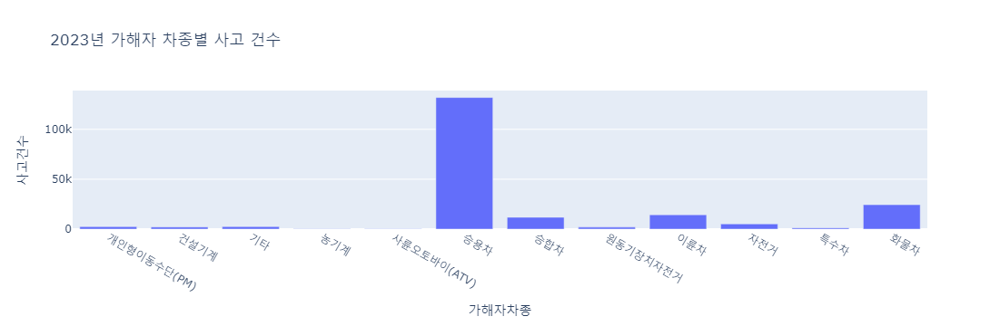

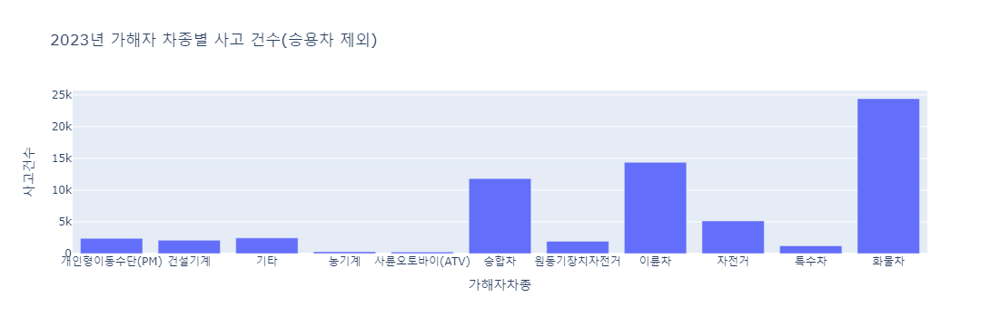

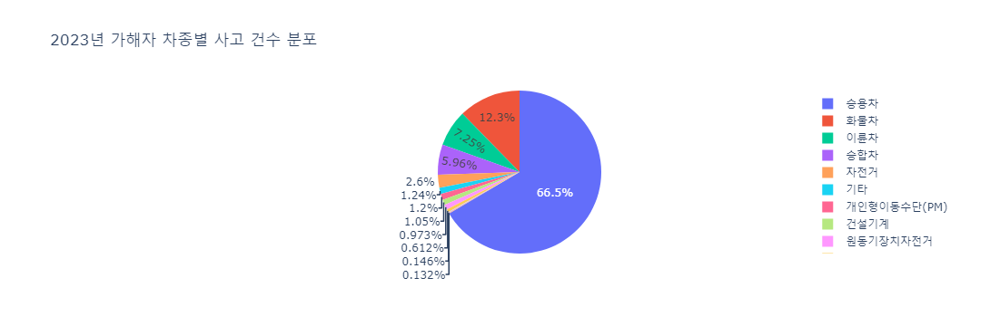

In [116]:
# 2022년 사고건수 전체 시각화
fig_all = px.bar(accident_count[accident_count['연도'] == 2023], x='가해자차종', y='사고건수', title="2023년 가해자 차종별 사고 건수")
fig_all.show()

# 2022년 사고 건수 승용차 제외하고 시각화
fig_exclude = px.bar(accident_count[(accident_count['연도'] == 2023) & (accident_count['가해자차종'] != '승용차')], 
                     x='가해자차종', y='사고건수', title="2023년 가해자 차종별 사고 건수(승용차 제외)")
fig_exclude.show()

# 2022년 사고건수 파이차트로 시각화
fig_pie = px.pie(accident_count[accident_count['연도'] == 2023], names='가해자차종', values='사고건수', title="2023년 가해자 차종별 사고 건수 분포")
fig_pie.show()

# __[연령대별 킥보드 사고건수 데이터 EDA 분석]__

# __Chapter 1. 데이터 불러오기__

In [126]:
# 데이터 호출하기
age_accident = pd.read_csv('data/preprocessed data/연령대별 킥보드 사고건수.csv', index_col=0)

----------

# __Chapter 2. 연령대별 연도별 사고 건수__

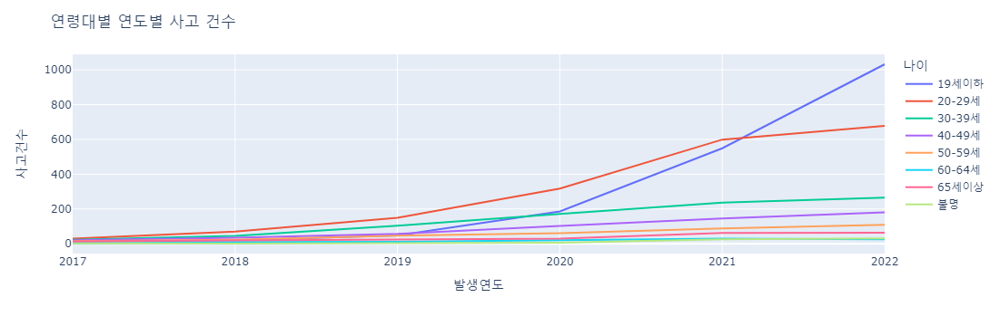

In [130]:
# Plotly로 선 그래프 그리기
fig = px.line(data_frame=age_accident, x='발생연도', y='사고건수', color='나이')
fig.update_layout(title='연령대별 연도별 사고 건수')

# 그래프 출력
fig.show()

-------

# __Chapter 3. 연령대별 연도별 사망자수__

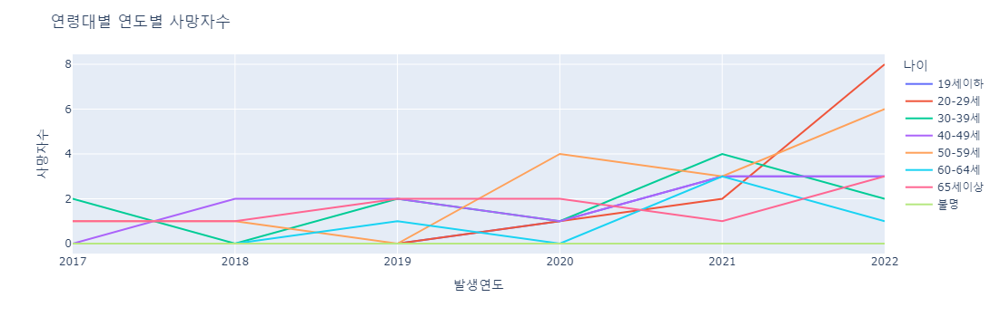

In [134]:
# Plotly로 선 그래프 그리기
fig = px.line(data_frame=age_accident, x='발생연도', y='사망자수', color='나이')
fig.update_layout(title='연령대별 연도별 사망자수')

# 그래프 출력
fig.show()

----------

# __Chapter 4. 연령대별 연도별 부상자수__

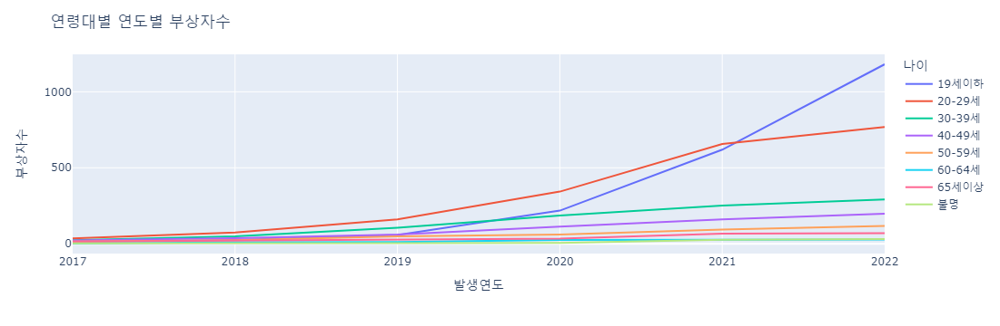

In [138]:
# Plotly로 선 그래프 그리기
fig = px.line(data_frame=age_accident, x='발생연도', y='부상자수', color='나이')
fig.update_layout(title='연령대별 연도별 부상자수')

# 그래프 출력
fig.show()